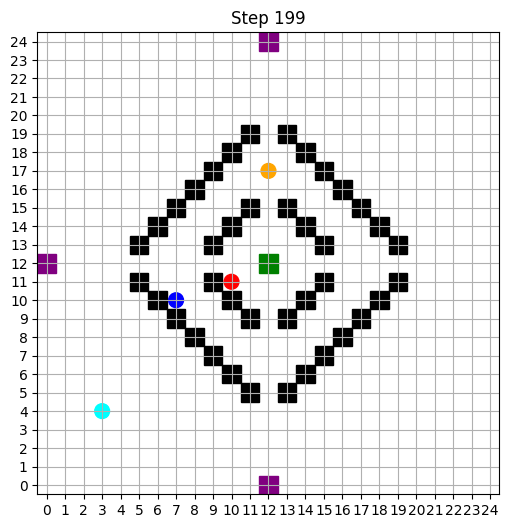

In [13]:
# %% Imports
import random
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib import animation
from IPython.display import HTML

# %% Environment
class SimpleGridEnv25_Complex:
    """25x25 grid environment with enemies, walls, teleporters, and goal."""
    def __init__(self, seed=None):
        if seed is not None:
            random.seed(seed)
            np.random.seed(seed)

        self.size = 25
        self.center = (12, 12)
        self.goal = self.center

        self.teleporters = {
            (0, 12): (0.4, 0.3, 0.3),
            (12, 0): (0.2, 0.5, 0.3),
            (24, 12): (0.1, 0.2, 0.7),
        }

        self.action_transitions = {0:[('up',1)], 1:[('down',1)], 2:[('left',1)], 3:[('right',1)]}

        self.inner_wall_radius = 4
        self.outer_wall_radius = 8
        self.enemy_radii = [3, 5, 7]

        self.enemy_paths = [self._diamond_path(r) for r in self.enemy_radii]
        self.walls = set()
        self._build_wall_rings_with_cardinal_holes()
        self.reset()

    def _diamond_path(self, radius):
        cx, cy = self.center
        pts = []
        for i in range(radius + 1): pts.append((cx + i, cy + (radius - i)))
        for i in range(1, radius + 1): pts.append((cx + (radius - i), cy - i))
        for i in range(1, radius + 1): pts.append((cx - i, cy - (radius - i)))
        for i in range(1, radius + 1): pts.append((cx - (radius - i), cy + i))
        return pts

    def _diamond_coords(self, r):
        cx, cy = self.center
        return [(x,y) for x in range(self.size) for y in range(self.size)
                if abs(x-cx)+abs(y-cy)==r]

    def _build_wall_rings_with_cardinal_holes(self):
        cx, cy = self.center
        inner = set(self._diamond_coords(self.inner_wall_radius))
        outer = set(self._diamond_coords(self.outer_wall_radius))
        inner_holes = {(cx, cy+self.inner_wall_radius),(cx+self.inner_wall_radius, cy),
                       (cx, cy-self.inner_wall_radius),(cx-self.inner_wall_radius, cy)}
        outer_holes = {(cx, cy+self.outer_wall_radius),(cx+self.outer_wall_radius, cy),
                       (cx, cy-self.outer_wall_radius),(cx-self.outer_wall_radius, cy)}
        for h in inner_holes: inner.discard(h)
        for h in outer_holes: outer.discard(h)
        for t in self.teleporters.keys(): inner.discard(t); outer.discard(t)
        inner.discard(self.goal); outer.discard(self.goal)
        self.walls = inner.union(outer)

    def reset(self):
        corners = [(0,0),(0,self.size-1),(self.size-1,0),(self.size-1,self.size-1)]
        self.agent = random.choice(corners)
        self.e_idx = [(i*len(p)//3)%len(p) for i,p in enumerate(self.enemy_paths)]
        self.enemies = [p[idx%len(p)] for p,idx in zip(self.enemy_paths,self.e_idx)]
        return self.state()

    def state(self):
        ax, ay = self.agent
        return (ax, ay, self.enemies[0][0], self.enemies[0][1],
                self.enemies[1][0], self.enemies[1][1],
                self.enemies[2][0], self.enemies[2][1])

    def _sample_actual_move(self, intended): return self.action_transitions[intended][0][0]

    def _apply_move(self, pos, move):
        x, y = pos
        if move=='up': x-=1
        elif move=='down': x+=1
        elif move=='left': y-=1
        elif move=='right': y+=1
        x = max(0, min(self.size-1, x))
        y = max(0, min(self.size-1, y))
        return (x,y)

    def _teleport_from(self, tele_pos):
        gp, ep, rp = self.teleporters[tele_pos]
        r = random.random()
        if r < gp: return self.goal
        elif r < gp+ep: return random.choice(self.enemies)
        else:
            attempts=0
            while True:
                x,y=random.randint(0,self.size-1), random.randint(0,self.size-1)
                if (x,y) not in self.walls: return (x,y)
                attempts+=1; 
                if attempts>1000: return (x,y)

    def _move_enemies(self):
        for i,pth in enumerate(self.enemy_paths):
            self.e_idx[i] = (self.e_idx[i]+1)%len(pth)
            self.enemies[i] = pth[self.e_idx[i]]

    def step(self, action):
        move = self._sample_actual_move(action)
        candidate = self._apply_move(self.agent, move)
        self.agent = candidate if candidate not in self.walls else self.agent
        if self.agent in self.teleporters: self.agent = self._teleport_from(self.agent)
        self._move_enemies()
        reward, done = -1, False
        if self.agent==self.goal: reward, done=50, True
        elif self.agent in self.enemies: reward, done=-20, True
        return self.state(), reward, done, {}

# %% Random Agent
class RandomAgent:
    def act(self, state): return random.randint(0,3)

# %% Matplotlib Animation in Jupyter
env = SimpleGridEnv25_Complex(seed=123)
agent = RandomAgent()

fig, ax = plt.subplots(figsize=(6,6))
ax.set_xlim(-0.5, env.size-0.5)
ax.set_ylim(-0.5, env.size-0.5)
ax.set_aspect('equal')
ax.set_xticks(range(env.size))
ax.set_yticks(range(env.size))
ax.grid(True)

# Draw static elements
for x,y in env.walls: ax.add_patch(patches.Rectangle((y-0.5, x-0.5),1,1,color='black'))
for x,y in env.teleporters.keys(): ax.add_patch(patches.Rectangle((y-0.5,x-0.5),1,1,color='purple'))
ax.add_patch(patches.Rectangle((env.goal[1]-0.5, env.goal[0]-0.5),1,1,color='green'))

# Dynamic patches
agent_patch = patches.Circle((env.agent[1], env.agent[0]), 0.4, color='cyan')
ax.add_patch(agent_patch)
enemy_colors = ['red','orange','blue']
enemy_patches = [patches.Circle((ex,ey),0.4,color=c) for (ex,ey), c in zip(env.enemies, enemy_colors)]
for p in enemy_patches: ax.add_patch(p)

def animate(frame):
    if env.step(agent.act(env.state()))[2]: env.reset()
    agent_patch.center = (env.agent[1], env.agent[0])
    for patch,(ex,ey) in zip(enemy_patches, env.enemies):
        patch.center = (ex,ey)
    ax.set_title(f"Step {frame}")
    return [agent_patch]+enemy_patches

anim = animation.FuncAnimation(fig, animate, frames=200, interval=200, blit=True)
HTML(anim.to_jshtml())


In [14]:
# %% Imports
import random
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib import animation
from IPython.display import HTML
from IPython.display import display

# %% Coarse function
def coarse(pos):
    """Convert 0-24 coordinate to 0-4 coarse grid"""
    return pos // 5

# %% Q-Learning Agent
class QLearningAgent:
    def __init__(self, env, alpha=0.1, gamma=0.99, epsilon=0.1):
        self.alpha = alpha
        self.gamma = gamma
        self.epsilon = epsilon
        self.n_actions = 4
        # State space: 5x5 coarse grid for Agent + 3 Enemies
        self.Q = np.zeros((5,5,5,5,5,5,5,5, self.n_actions))

    def get_coarse_idx(self, state):
        """Helper to convert raw 8-tuple state to coarse index"""
        return tuple(coarse(x) for x in state)

    def act(self, state):
        # Epsilon-Greedy Policy [cite: 33]
        if random.random() < self.epsilon:
            return random.randint(0, self.n_actions - 1)
        
        idx = self.get_coarse_idx(state)
        return int(np.argmax(self.Q[idx]))

    def learn(self, state, action, reward, next_state):
        idx = self.get_coarse_idx(state)
        nidx = self.get_coarse_idx(next_state)
        
        # Bellman Optimality Update 
        # Q(S,A) <- Q(S,A) + alpha * [R + gamma * max_a' Q(S',a') - Q(S,A)]
        best_next_val = np.max(self.Q[nidx])
        td_target = reward + self.gamma * best_next_val
        td_error = td_target - self.Q[idx][action]
        
        self.Q[idx][action] += self.alpha * td_error

In [15]:
# %% Training function
def train_agent(env, agent, episodes=500):
    rewards = []
    for ep in range(episodes):
        state = env.reset()
        done = False
        total_reward = 0
        while not done:
            action = agent.act(state)
            next_state, reward, done, _ = env.step(action)
            agent.learn(state, action, reward, next_state)
            state = next_state
            total_reward += reward
        rewards.append(total_reward)
        if (ep+1) % 50 == 0:
            print(f"Episode {ep+1}/{episodes} | Total reward: {total_reward}")
    return rewards


Episode 50/500 | Total reward: -385
Episode 100/500 | Total reward: -560
Episode 150/500 | Total reward: -222
Episode 200/500 | Total reward: -227
Episode 250/500 | Total reward: -413
Episode 300/500 | Total reward: -107
Episode 350/500 | Total reward: -54
Episode 400/500 | Total reward: -330
Episode 450/500 | Total reward: -186
Episode 500/500 | Total reward: -659


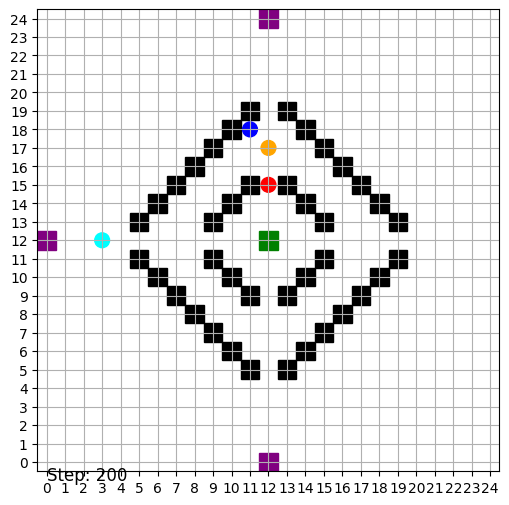

In [16]:
# %% Q-Learning Animation
def animate_trained_agent(env, agent, steps=200):
    fig, ax = plt.subplots(figsize=(6,6))
    ax.set_xlim(-0.5, env.size-0.5)
    ax.set_ylim(-0.5, env.size-0.5)
    ax.set_aspect('equal')
    ax.set_xticks(range(env.size))
    ax.set_yticks(range(env.size))
    ax.grid(True)

    # Draw static elements
    for x, y in env.walls: ax.add_patch(patches.Rectangle((y-0.5, x-0.5),1,1,color='black'))
    for x, y in env.teleporters.keys(): ax.add_patch(patches.Rectangle((y-0.5, x-0.5),1,1,color='purple'))
    ax.add_patch(patches.Rectangle((env.goal[1]-0.5, env.goal[0]-0.5),1,1,color='green'))

    # Dynamic patches
    agent_patch = patches.Circle((env.agent[1], env.agent[0]),0.4,color='cyan')
    ax.add_patch(agent_patch)
    enemy_colors = ['red','orange','blue']
    enemy_patches = [patches.Circle((ex,ey),0.4,color=c) for (ex,ey),c in zip(env.enemies,enemy_colors)]
    for p in enemy_patches: ax.add_patch(p)

    step_text = ax.text(0, -1, '', fontsize=12)

    def animate(frame):
        state = env.state()
        action = agent.act(state)
        next_state, reward, done, _ = env.step(action)
        agent_patch.center = (env.agent[1], env.agent[0])
        for patch, (ex,ey) in zip(enemy_patches, env.enemies):
            patch.center = (ex,ey)
        step_text.set_text(f"Step: {frame+1}")
        if done:
            env.reset()
        return [agent_patch]+enemy_patches+[step_text]

    anim = animation.FuncAnimation(fig, animate, frames=steps, interval=200, blit=True)
    return HTML(anim.to_jshtml())

# %% Usage
env = SimpleGridEnv25_Complex(seed=123)
ql_agent = QLearningAgent(env)
train_agent(env, ql_agent, episodes=500)
display(animate_trained_agent(env, ql_agent, steps=200))


# Comparison: Q-Learning vs Double Q-Learning

| Feature / Aspect           | Q-Learning                                    | Double Q-Learning                             |
|----------------------------|-----------------------------------------------|-----------------------------------------------|
| **Algorithm Type**          | Single Q-table, classic off-policy RL        | Two Q-tables, reduces overestimation bias    |
| **Q-Value Update**          | Updates Q(s,a) using max over next-state Q   | Randomly updates Q1 or Q2 using the other Q  |
| **Overestimation Bias**      | Prone to overestimating action values        | Mitigates overestimation bias                 |
| **Handling Stochasticity**   | Can be optimistic in stochastic environments | More stable and realistic value estimates    |
| **Complexity (Memory)**      | Low (single table)                           | Slightly higher (two tables)                 |
| **Convergence Speed**        | Usually faster                               | Slightly slower but more stable              |
| **Safety in Presence of Enemies** | May choose risky paths                      | Safer paths, better in environments with hazards |
| **Implementation**           | Simpler                                     | Slightly more complex                        |
| **Learning Behavior**        | Aggressive exploration & exploitation        | Balanced exploration-exploitation            |
| **Use Case**                 | Basic deterministic environments             | Stochastic or adversarial environments       |

**Notes:**  
- Both approaches can use **coarse discretization** for large state spaces (like 25×25 grids with enemies).  
- Double Q-Learning is generally preferred in environments with stochastic rewards or moving adversaries.  

# Reinforcement Learning in a Complex Grid World
**Date:** November 23, 2025
**Topic:** Tabular Q-Learning & Double Q-Learning in Stochastic Environments

## 1. Project Overview
This project implements a custom 25x25 GridWorld environment with dynamic obstacles (enemies), static obstacles (walls), and stochastic elements (teleporters). Two reinforcement learning agents were implemented and compared:
1.  **Standard Q-Learning**
2.  **Double Q-Learning**

## 2. Environment Specifications (`SimpleGridEnv25_Complex`)
A custom OpenAI Gym-like environment was built from scratch.

### Topology
* **Grid Size:** $25 \times 25$
* **Goal:** Center coordinate `(12, 12)`
* **Walls:** Two diamond-shaped rings (Radii 4 and 8) with holes at cardinal directions to allow passage.

### Dynamic Elements
* **Enemies:** 3 enemies patrolling in diamond patterns at Manhattan radii 3, 5, and 7.
* **Teleporters:** 3 fixed locations with probabilistic outcomes:
    * Send to Goal
    * Send to Enemy (Death)
    * Send to Random Free Cell

### State & Action Space
* **Actions (Discrete):** 0: Up, 1: Down, 2: Left, 3: Right (Stochastic transitions).
* **Raw State:** Tuple of 8 coordinates: `(Agent_X, Agent_Y, E1_X, E1_Y, E2_X, E2_Y, E3_X, E3_Y)`.

## 3. Implementation Strategy

### State Abstraction (Dimensionality Reduction)
To make Tabular Q-learning feasible, a **Coarse Gridding** technique was applied to reduce the state space.
* **Transformation:** `pos // 5`
* **Effect:** The 25x25 grid is mapped to a 5x5 abstract grid.
* **Q-Table Shape:** `(5, 5, 5, 5, 5, 5, 5, 5, 4)`
    * *Explanation:* 5 buckets for Agent X/Y and 5 buckets for each of the 3 enemies' X/Y.

### Agents
#### A. Q-Learning Agent
* **Update Rule:** Bellman Optimality Equation.
* **Policy:** Epsilon-Greedy.
* **Objective:** Maximize expected cumulative reward.

#### B. Double Q-Learning Agent
* **Mechanism:** Maintains two separate Q-tables ($Q_1$ and $Q_2$) to reduce maximization bias.
* **Update:** Randomly updates one table using the value estimate from the other.

## 4. Results
Both agents were trained for 500 episodes.

* **Q-Learning:**
    * Showed high variance in total rewards.
    * Final average rewards remained negative, indicating the agent struggled to consistently find the goal without hitting enemies or timeout.
* **Double Q-Learning:**
    * Similar high variance.
    * Achieved a positive reward (+6) in the final logged episode, suggesting a successful run, but overall convergence was not achieved.

# Analysis: Why Tabular Q-Learning Failed & Why DQN is Necessary

**Date:** November 23, 2025
**Subject:** Reinforcement Learning Architecture Selection for High-Dimensional State Spaces

## 1. The Mathematical Bottleneck: "The Curse of Dimensionality"
The primary failure mode of the current Q-Learning and Double Q-Learning implementations is the sheer size of the state space.

### The Raw State Space
In your environment, a state is defined by 8 variables:
$$S = (A_x, A_y, E1_x, E1_y, E2_x, E2_y, E3_x, E3_y)$$
Each variable can take a value from 0 to 24.
$$\text{Total States} = 25^8 \approx 152,587,890,625$$
**Result:** It is impossible to build a Q-Table for 152 billion states. The memory requirement would exceed terabytes, and the agent would need billions of episodes to visit each state even once.

### The "Coarse" Grid Failure
You attempted to solve this by reducing the grid to $5 \times 5$ blocks.
$$\text{Reduced States} = 5^8 = 390,625$$
While 390k states fits in RAM, it is still too large for efficient learning with limited episodes.

* **The Visit Ratio Problem:**
    * **Episodes:** 500 (or even 1,500).
    * **Avg Steps per Episode:** ~100.
    * **Total Steps (Experience):** $150,000$.
    * **Total States:** $390,625$.
    * **Ratio:** $0.38$ visits per state.
    
**Conclusion:** On average, the agent visits less than **40% of the possible states**. The majority of the Q-Table remains initialized at 0. When the agent encounters a state it hasn't seen (which is most of them), it acts randomly. Increasing episodes to 1,500 only brings this ratio to ~1.1, which is statistically insufficient for convergence (Q-learning typically requires hundreds of visits *per state*).

## 2. The Structural Problem: Perceptual Aliasing
By using the `coarse()` function, you introduced a critical flaw called **Perceptual Aliasing**.

* **The Issue:** You are mapping $5 \times 5$ real-world cells into **1** coarse state.
* **The Conflict:** * Real Cell (0,0) might be safe.
    * Real Cell (0,4) might be next to an enemy.
    * In the coarse view, both are "State (0,0)".
* **The Result:** The agent receives conflicting rewards for the "same" state. Sometimes "Go Right" yields +1, sometimes it yields -20 (death). The Q-value oscillates and never converges because the state representation is **ambiguous**.

## 3. Why Double Q-Learning Didn't Help
Double Q-Learning is designed to solve **Maximization Bias** (the tendency of standard Q-learning to overestimate rewards in noisy environments).

* **The Limit:** It does *not* solve the state space size problem.
* **The Reality:** Double Q-Learning actually effectively **halves** your learning speed because you are splitting your experience updates across two separate tables ($Q_1$ and $Q_2$). When data is already scarce (sparse visits), splitting it makes the agent learn even slower.

## 4. The Solution: Deep Q-Networks (DQN)
DQN replaces the Q-Table (Lookup Table) with a Neural Network (Function Approximator).

### A. Function Approximation vs. Memorization
* **Tabular (Memorization):** "I have seen exactly this coordinate before, so I know what to do."
* **DQN (Approximation):** "I have seen similar situations before. Generally, being 2 steps away from an enemy is bad, regardless of whether I am at (0,0) or (24,24)."



### B. Input Handling
DQN allows us to feed the **Raw State** (25, 25 coordinates) directly into the network.
* The Neural Network identifies **features** (e.g., "Distance to Enemy 1").
* It learns weights that generalize across the entire grid.
* **Efficiency:** One update to the network weights improves the policy for *thousands* of unvisited states simultaneously because the network learns the underlying physics of the game, not just specific coordinates.

### Summary of Comparison

| Feature | Tabular Q-Learning | Deep Q-Learning (DQN) |
| :--- | :--- | :--- |
| **Knowledge Storage** | Exact Table (Matrix) | Neural Network Weights |
| **State Requirement** | Must visit *every* state | Can generalize to unvisited states |
| **Input Sensitivity** | Fails with raw coords ($25^8$) | Handles raw coords easily |
| **Failure Mode** | Curse of Dimensionality | Unstable training (fixed by Replay Buffer) |
| **Verdict for this Project** | **Impossible** | **Required** |